# Analysis - Participant 1

In [ ]:
#%matplotlib qt
%matplotlib inline
from scipy import stats
import mne
import numpy as np
import pandas as pd
import sklearn
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
epochs_1 = mne.read_epochs('..\data_EEG\\1_filtered_epochs-epo.fif', preload=True)
raw_1 = mne.io.read_raw_fif('..\data_EEG\\1_cleaned_raw.fif', preload=True)
#updated_behav_1 = pd.read_csv('..\data_behavioral\\1_updated_behav.csv')


In [ ]:
epochs_1.info

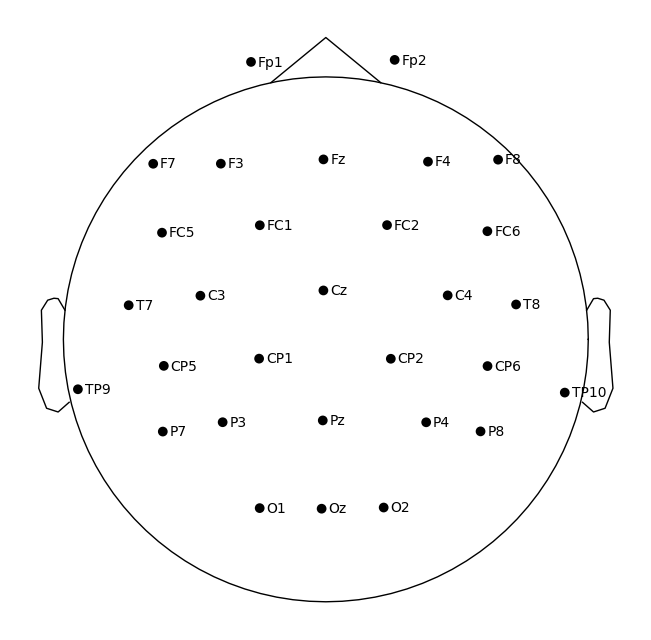

In [825]:
#epochs_1.info['bads'] = [] 
epochs_1.plot_sensors(show_names=True);


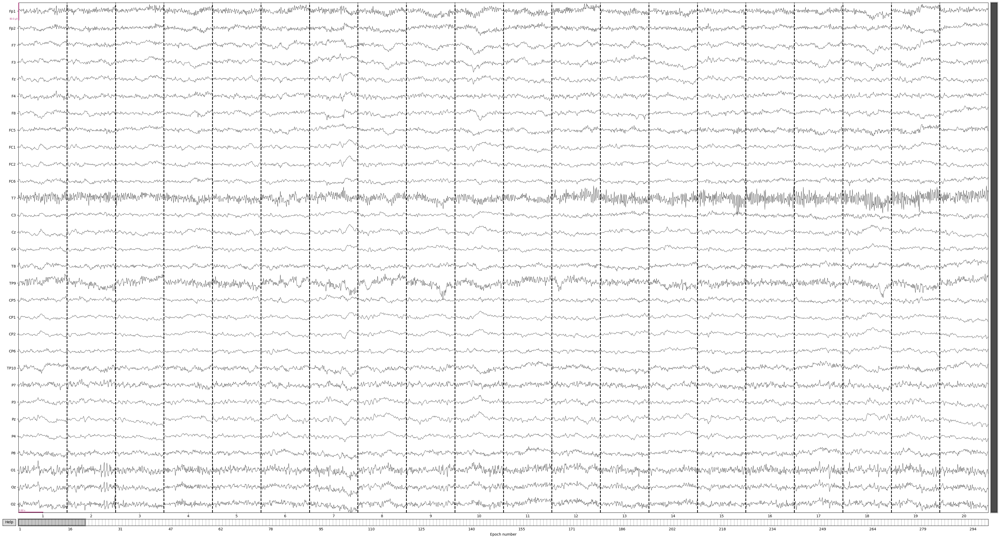

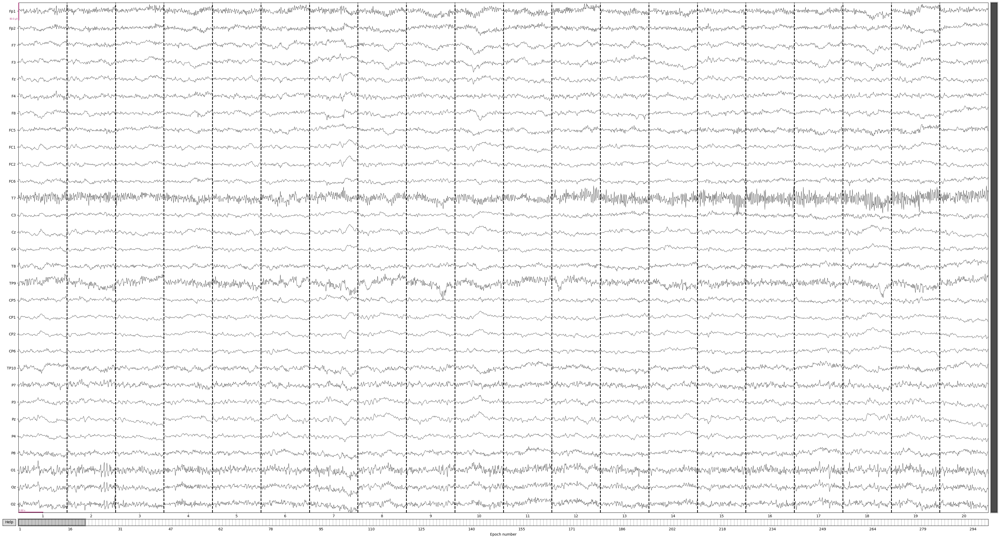

In [826]:
scalings = {'eeg': 40e-6, 'eog': 150e-6}  
#raw_1.plot(n_channels=33, scalings=scalings, title='Filtered EEG Data', start=0, duration=6, block=True);
epochs_1.plot(block=True, n_channels=33, scalings=scalings)


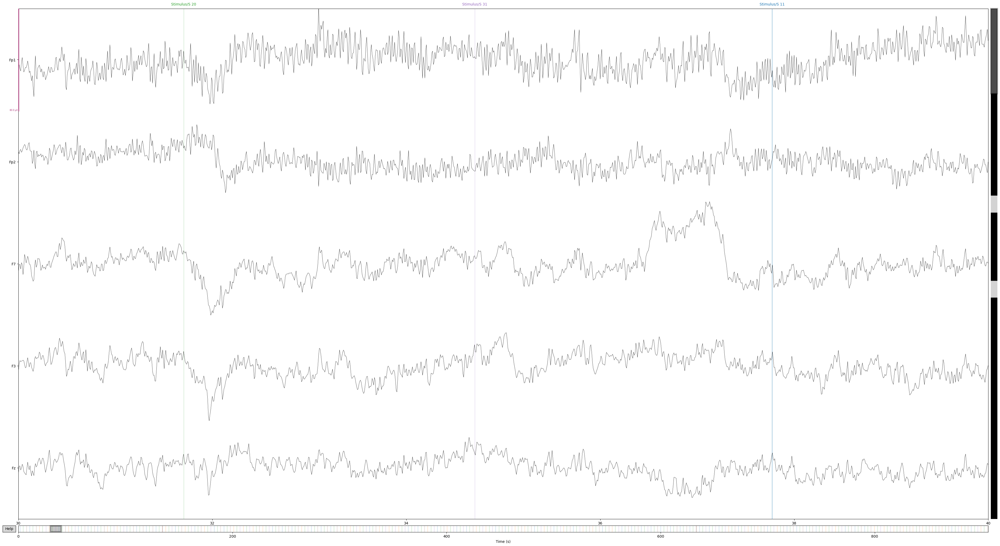

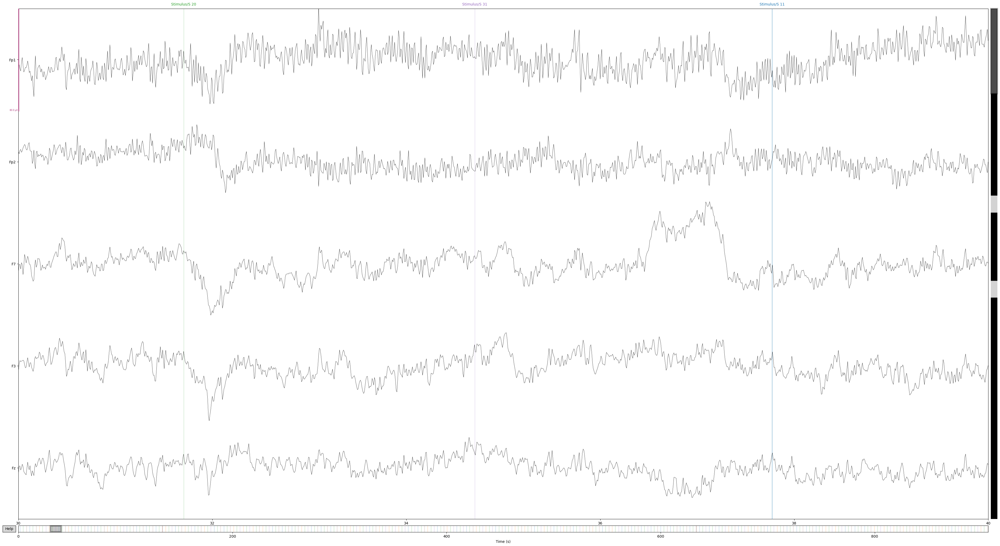

In [828]:
#epochs_1.plot(block=True, n_channels=33, scalings=scalings, start=0)
raw_1.plot(block=True, n_channels=5, scalings=scalings, start=30)



In [ ]:
data = epochs_1.get_data(copy=True)

In [ ]:
original_bads = epochs_1.info['bads'] 
epochs_1.info['bads'] = [] 
epochs_1.plot_sensors(show_names=True);
#TP9, T7

In [ ]:
Word = epochs_1["Word"]
Cue = epochs_1["Cue"]
Pred = epochs_1["Pred"]


In [ ]:
Pred.apply_baseline(baseline=(-0.2, 0))
Cue.plot_image(picks=["Oz"])

In [823]:
Word_Congruent = epochs_1["Word/Congruent"]
Word_Incongruent = epochs_1["Word/Incongruent"]

evoked_con = Word_Congruent.average()
evoked_con = evoked_con.pick_channels([ "Fz", "Cz" , "FC1", "FC2"])
evoked_incon = Word_Incongruent.average()
evoked_incon = evoked_incon.pick_channels([ "Fz", "Cz" , "FC1", "FC2" ])


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\199101979.py:5: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  evoked_con = evoked_con.pick_channels([ "Fz", "Cz" , "FC1", "FC2"])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\199101979.py:7: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  evoked_incon = evoked_incon.pick_channels([ "Fz", "Cz" , "FC1", "FC2" ])


In [ ]:
evoked_con

combining channels using "mean"
combining channels using "mean"


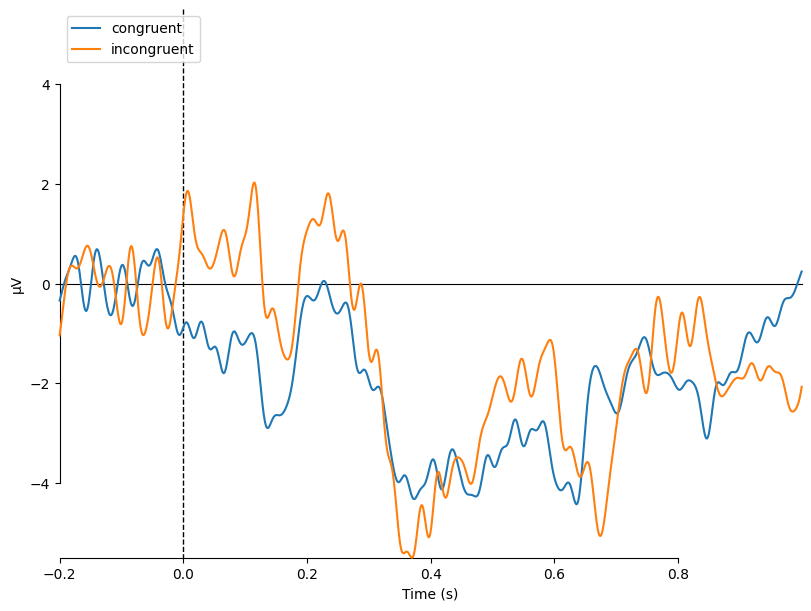

[<Figure size 800x600 with 1 Axes>]

In [822]:
mne.viz.plot_compare_evokeds({"congruent":evoked_con, "incongruent":evoked_incon}, combine="mean")

In [ ]:
epochs_1

In [ ]:
event_id_1 = {
    'Stable/Cue/Tool': 111, 
    'Stable/Cue/Animal': 112, 
    'Stable/Pred/Incorrect': 120, 
    'Stable/Pred/Correct': 121, 
    'Stable/Word/Tool/Congruent': 1311, 
    'Stable/Word/Animal/Incongruent': 1322,
    'Stable/Word/Animal/Congruent': 1321, 
    'Stable/Word/Tool/Incongruent': 1312, 
    'Volatile/Cue/Tool': 211, 
    'Volatile/Cue/Animal': 212, 
    'Volatile/Pred/Incorrect': 220, 
    'Volatile/Pred/Correct': 221, 
    'Volatile/Word/Tool/Congruent': 2311, 
    'Volatile/Word/Animal/Incongruent': 2322,
    'Volatile/Word/Animal/Congruent': 2321, 
    'Volatile/Word/Tool/Incongruent': 2312, 
}

In [ ]:
original_event_id_1 = epochs_1.event_id
events_1 = epochs_1.events
updated_events = events_1.copy()
num_stable_epochs = 145

# Function to map original event codes to stable/volatile codes
def map_event_code(event_code, epoch_index, num_stable_epochs):
    if event_code in original_event_id_1.values():
        key = list(original_event_id_1.keys())[list(original_event_id_1.values()).index(event_code)]
        if epoch_index < num_stable_epochs:
            return event_id_1[f'Stable/{key}']
        else:
            return event_id_1[f'Volatile/{key}']
    return event_code

# Update event codes
for i in range(len(events_1)):
    event_code = events_1[i, 2]
    updated_events[i, 2] = map_event_code(event_code, i, num_stable_epochs)

In [ ]:
drop_log = epochs_1.drop_log
bad_epochs_indices = [i for i, log in enumerate(drop_log) if len(log) > 0]

print(bad_epochs_indices)

In [ ]:
updated_events

In [ ]:
events_1 = epochs_1.events
updated_events = events_1.copy()
num_stable_epochs = 145

# Stable epochs
for i in range(num_stable_epochs):
    event_code = events_1[i, 2]
    if event_code in event_id_1.values():
        key = list(event_id_1.keys())[list(event_id_1.values()).index(event_code)]
        new_event_code = event_id_1[f'Stable/{key}']
        updated_events[i, 2] = new_event_code

In [ ]:
# volatile epochs
for i in range(num_stable_epochs, len(events_1)):
    event_code = events_1[i, 2]
    if event_code in event_id_1.values():
        key = list(event_id_1.keys())[list(event_id_1.values()).index(event_code)]
        new_event_code = event_id_1[f'Volatile/{key}']
        updated_events[i, 2] = new_event_code

In [ ]:
event_id_1

In [ ]:
epochs_1.events = updated_events
epochs_1.event_id = event_id_1


In [ ]:
epochs_1.save('../data_EEG/1_filtered_epochs-epo.fif', overwrite=True)
raw_1.save('../data_EEG/1_cleaned_raw.fif', overwrite=True)

In [821]:
events_1 = epochs_1.events
event_id_1 = epochs_1.event_id

In [820]:
correct_indices = []
incorrect_indices = []

# Iterate through the events
for i, event in enumerate(events_1[:-1]):  
    # Check if the current event is a correct prediction and the next is a word
    if event[2] in (event_id_1['Stable/Pred/Correct'], event_id_1['Volatile/Pred/Correct']) and events_1[i + 1][2] in (
        event_id_1['Stable/Word/Animal/Congruent'], event_id_1['Stable/Word/Animal/Incongruent'],
        event_id_1['Stable/Word/Tool/Congruent'], event_id_1['Stable/Word/Tool/Incongruent'],
        event_id_1['Volatile/Word/Animal/Congruent'], event_id_1['Volatile/Word/Animal/Incongruent'],
        event_id_1['Volatile/Word/Tool/Congruent'], event_id_1['Volatile/Word/Tool/Incongruent']):
        correct_indices.append(i + 1)  
    # Check if the current event is an incorrect prediction and the next is a word
    elif event[2] in (event_id_1['Stable/Pred/Incorrect'], event_id_1['Volatile/Pred/Incorrect']) and events_1[i + 1][2] in (
        event_id_1['Stable/Word/Animal/Congruent'], event_id_1['Stable/Word/Animal/Incongruent'],
        event_id_1['Stable/Word/Tool/Congruent'], event_id_1['Stable/Word/Tool/Incongruent'],
        event_id_1['Volatile/Word/Animal/Congruent'], event_id_1['Volatile/Word/Animal/Incongruent'],
        event_id_1['Volatile/Word/Tool/Congruent'], event_id_1['Volatile/Word/Tool/Incongruent']):
        incorrect_indices.append(i + 1)  

print("Correct prediction indices:", correct_indices)
print("Incorrect prediction indices:", incorrect_indices)

Correct prediction indices: [1, 4, 7, 10, 16, 19, 22, 25, 28, 31, 34, 39, 42, 45, 48, 51, 54, 57, 60, 65, 68, 77, 82, 85, 90, 93, 99, 102, 105, 108, 111, 114, 123, 126, 129, 135, 138, 141, 144, 153, 156, 159, 162, 167, 170, 173, 179, 182, 185, 193, 196, 199, 202, 210, 213, 216, 219, 221, 224, 227, 230, 233, 236, 239, 242, 245, 248, 251, 254, 257, 260, 269, 272, 275, 278, 281, 284, 287]
Incorrect prediction indices: [13, 71, 74, 96, 117, 120, 132, 147, 150, 176, 188, 191, 205, 208, 263, 266]


In [819]:
word_correct_pred_epochs = epochs_1[correct_indices]
# Create epochs for words following incorrect predictions
word_incorrect_pred_epochs = epochs_1[incorrect_indices]
len(correct_indices)


78

In [818]:
# Initialize lists to store indices for each condition
stable_incorrect_indices = []
volatile_incorrect_indices = []

# Iterate through the events to find the indices
for i, event in enumerate(events_1[:-1]): 
    # Check if the current event is a prediction and the next is a word
    if event[2] == event_id_1['Stable/Pred/Incorrect'] and events_1[i + 1][2] in (
            event_id_1['Stable/Word/Animal/Congruent'], event_id_1['Stable/Word/Animal/Incongruent'],
            event_id_1['Stable/Word/Tool/Congruent'], event_id_1['Stable/Word/Tool/Incongruent']):
        stable_incorrect_indices.append(i + 1)
    elif event[2] == event_id_1['Volatile/Pred/Incorrect'] and events_1[i + 1][2] in (
            event_id_1['Volatile/Word/Animal/Congruent'], event_id_1['Volatile/Word/Animal/Incongruent'],
            event_id_1['Volatile/Word/Tool/Congruent'], event_id_1['Volatile/Word/Tool/Incongruent']):
        volatile_incorrect_indices.append(i + 1)

print(stable_incorrect_indices)
print(volatile_incorrect_indices)

[13, 71, 74, 96, 117, 120, 132]
[147, 150, 176, 188, 191, 205, 208, 263, 266]


In [ ]:
epochs_1["Word"].selection

combining channels using "gfp"
combining channels using "gfp"


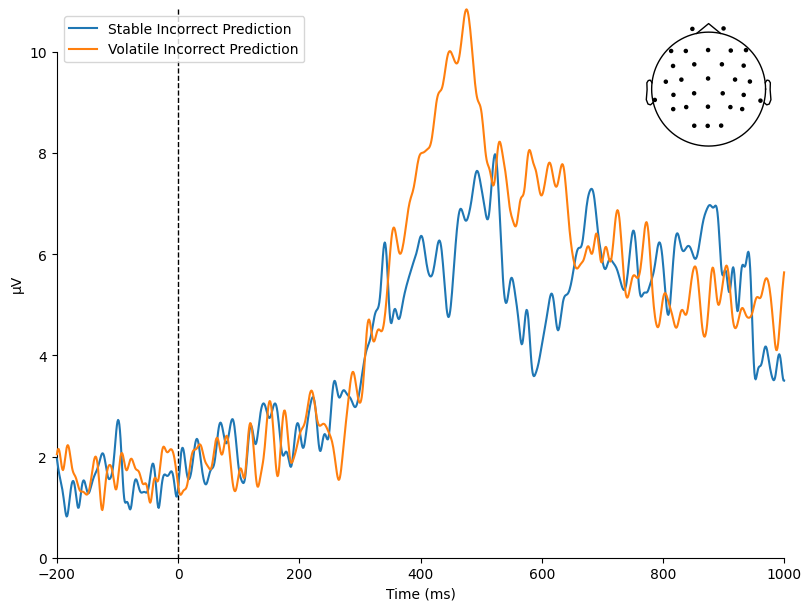

[<Figure size 800x600 with 2 Axes>]

In [817]:
stable_word_incorrect_pred_epochs = epochs_1[stable_incorrect_indices]
volatile_word_incorrect_pred_epochs = epochs_1[volatile_incorrect_indices]

# Compute the evoked responses
evoked_stable_incorrect = stable_word_incorrect_pred_epochs.average()
evoked_volatile_incorrect = volatile_word_incorrect_pred_epochs.average()

# Compare the evoked responses
mne.viz.plot_compare_evokeds({
    'Stable Incorrect Prediction': evoked_stable_incorrect,
    'Volatile Incorrect Prediction': evoked_volatile_incorrect
}, legend='upper left', show_sensors='upper right', time_unit='ms')

In [ ]:
evoked_incorrect

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\67106161.py:13: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds({'Correct Prediction': evoked_correct_f3,


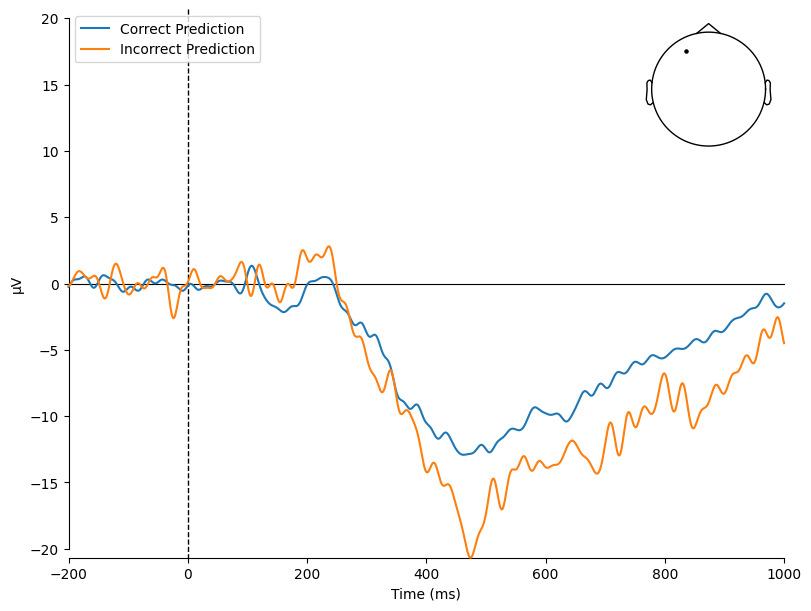

[<Figure size 800x600 with 2 Axes>]

In [816]:
evoked_correct = word_correct_pred_epochs.average()
evoked_incorrect = word_incorrect_pred_epochs.average()

# Compare
#mne.viz.plot_compare_evokeds({'Correct Prediction': evoked_correct, 
#                              'Incorrect Prediction': evoked_incorrect},
#                             legend='upper left', show_sensors='upper right')

evoked_correct_f3 = evoked_correct.copy().pick_channels(["F3"])
evoked_incorrect_f3 = evoked_incorrect.copy().pick_channels(["F3"])

# Compare the evoked responses for the F3 electrode
mne.viz.plot_compare_evokeds({'Correct Prediction': evoked_correct_f3, 
                              'Incorrect Prediction': evoked_incorrect_f3},
                             legend='upper left', show_sensors='upper right', time_unit='ms', combine="mean")

In [ ]:
raw_1.plot_sensors(kind='topomap', show_names=True, ch_type='eeg', title='Sensor Locations')


combining channels using "gfp"


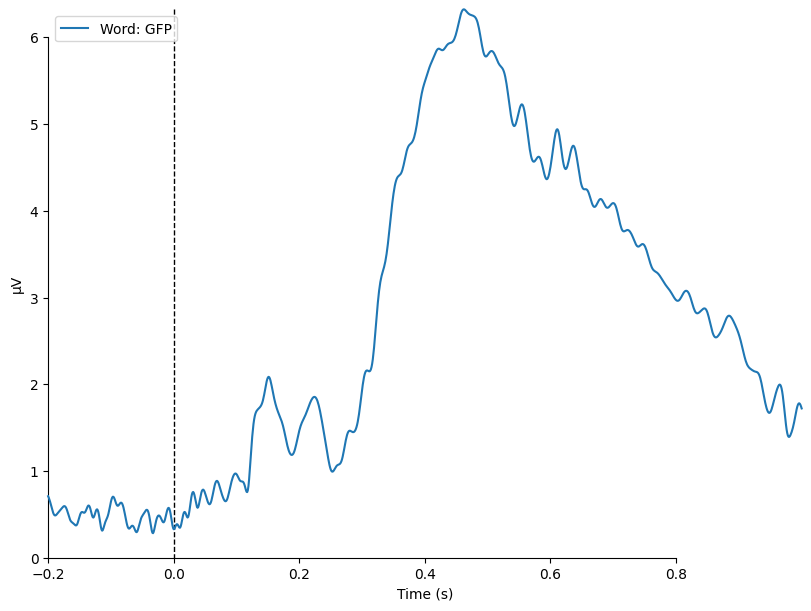

[<Figure size 800x600 with 1 Axes>]

In [815]:
mne.viz.plot_compare_evokeds({"Word: GFP": Word_evoked})


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\2139351136.py:31: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Cue_stable_evoked = Cue_stable.average().pick_channels(["Pz", "P3", "P4"])


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\2139351136.py:33: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Cue_volatile_evoked = Cue_volatile.average().pick_channels(["Pz", "P3", "P4"])


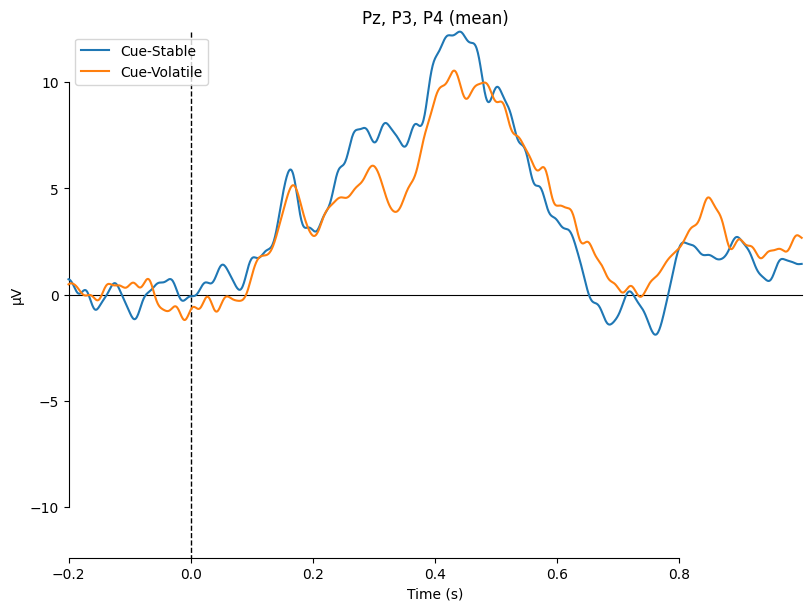

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\2139351136.py:40: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Prediction_stable_evoked = Prediction_stable.average().pick_channels(["Pz", "P3", "P4"])


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\2139351136.py:42: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Prediction_volatile_evoked = Prediction_volatile.average().pick_channels(["Pz", "P3", "P4"])


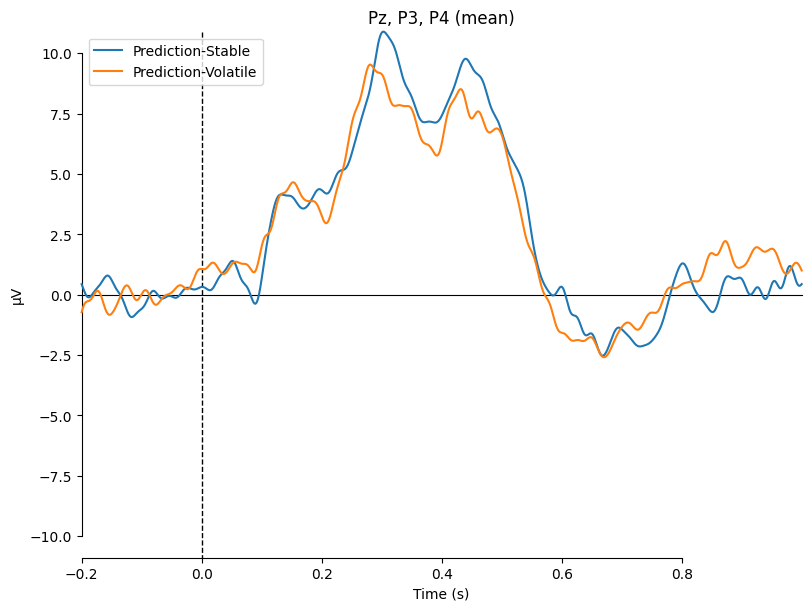

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\2139351136.py:48: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Word_stable_evoked = Word_stable.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\2139351136.py:50: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Word_volatile_evoked = Word_volatile.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])


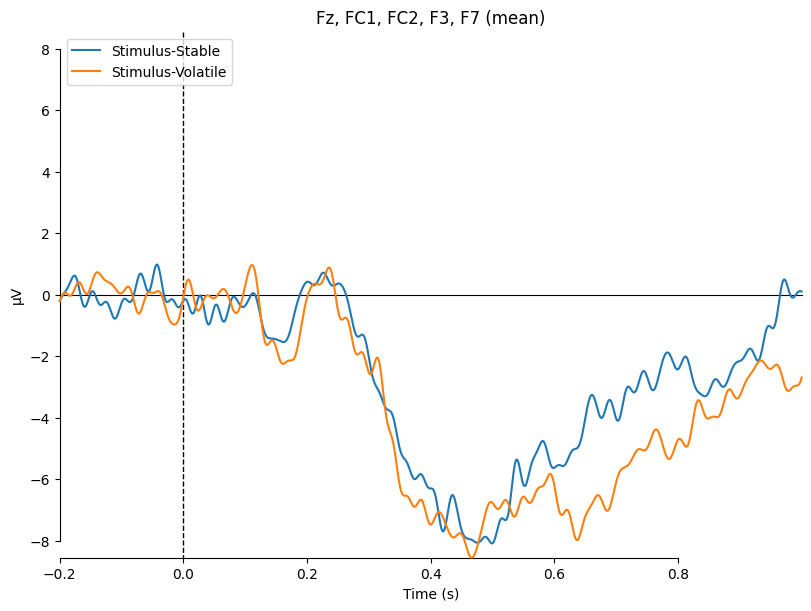

[<Figure size 800x600 with 1 Axes>]

In [813]:
"""# Cue Stable vs Volatile
Cue_stable = epochs_1["Stable/Cue"]
Cue_stable_evoked = Cue_stable.average()
Cue_volatile = epochs_1["Volatile/Cue"]
Cue_volatile_evoked = Cue_volatile.average()
mne.viz.plot_compare_evokeds({"Cue-Stable": Cue_stable_evoked,"Cue-Volatile": Cue_volatile_evoked})


# Prediction Stable vs Volatile
Prediction_stable = epochs_1["Stable/Pred"]
Prediction_stable_evoked = Prediction_stable.average()
Prediction_volatile = epochs_1["Volatile/Pred"]
Prediction_volatile_evoked = Prediction_volatile.average()
mne.viz.plot_compare_evokeds({"Prediction-Stable": Prediction_stable_evoked,"Prediction-Volatile": Prediction_volatile_evoked})


# Stimulus Stable vs Volatile
Word_stable = epochs_1["Stable/Word"]
Word_stable_evoked = Word_stable.average()
Word_volatile = epochs_1["Volatile/Word"]
Word_volatile_evoked = Word_volatile.average()
mne.viz.plot_compare_evokeds({"Stimulus-Stable": Word_stable_evoked,"Stimulus-Volatile": Word_volatile_evoked})

Prediction = epochs_1["Pred"]
Prediction_evoked = Prediction.average()
mne.viz.plot_compare_evokeds({"Prediction": Prediction_evoked})"""


# Cue Stable vs Volatile
Cue_stable = epochs_1["Stable/Cue"]
Cue_stable_evoked = Cue_stable.average().pick_channels(["Pz", "P3", "P4"])
Cue_volatile = epochs_1["Volatile/Cue"]
Cue_volatile_evoked = Cue_volatile.average().pick_channels(["Pz", "P3", "P4"])

mne.viz.plot_compare_evokeds({"Cue-Stable": Cue_stable_evoked, "Cue-Volatile": Cue_volatile_evoked}, picks=["Pz", "P3", "P4"], combine="mean")


# Prediction Stable vs Volatile
Prediction_stable = epochs_1["Stable/Pred"]
Prediction_stable_evoked = Prediction_stable.average().pick_channels(["Pz", "P3", "P4"])
Prediction_volatile = epochs_1["Volatile/Pred"]
Prediction_volatile_evoked = Prediction_volatile.average().pick_channels(["Pz", "P3", "P4"])

mne.viz.plot_compare_evokeds({"Prediction-Stable": Prediction_stable_evoked, "Prediction-Volatile": Prediction_volatile_evoked}, picks=["Pz", "P3", "P4"], combine="mean")

# Stimulus Stable vs Volatile
Word_stable = epochs_1["Stable/Word"]
Word_stable_evoked = Word_stable.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])
Word_volatile = epochs_1["Volatile/Word"]
Word_volatile_evoked = Word_volatile.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])

mne.viz.plot_compare_evokeds({"Stimulus-Stable": Word_stable_evoked, "Stimulus-Volatile": Word_volatile_evoked}, picks=["Fz", "FC1", "FC2", "F3", "F7"], combine="mean")



In [ ]:
Cue = epochs_1["Cue"]
Cue_evoked = Cue.average()

Word = epochs_1["Word"]
Word_evoked = Word.average()

Pred = epochs_1["Pred"]
Pred_evoked = Pred.average()

Pred_stable = epochs_1["Stable/Pred"]
Pred_volatile = epochs_1["Volatile/Pred"]

Pred_stable_evoked = Pred_stable.average()
Pred_volatile_evoked = Pred_volatile.average()

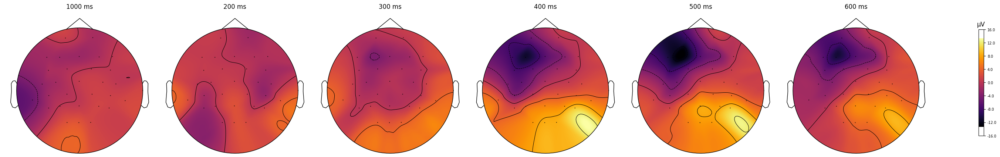

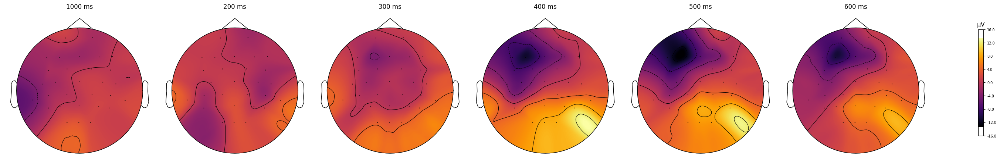

In [812]:
peak_times = [1,0.2,0.3,0.4,0.5,0.6]
Word_evoked.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))

#Pred_stable_evoked.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))
#Pred_volatile_evoked.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))



In [ ]:
times = np.linspace(0.1, 0.700, 50)

fig, anim = Word_evoked.animate_topomap(times=times, frame_rate=100, time_unit='ms', blit=False, extrapolate="head",  sphere=(0.0, 0.0, 0.0, 0.12))
for ax in fig.axes:
    for im in ax.get_images():
        im.set_cmap("inferno")

anim.save('Word_inferno_evoked_topomap.gif', fps=100)

In [ ]:
epochs_1.info['ch_names']

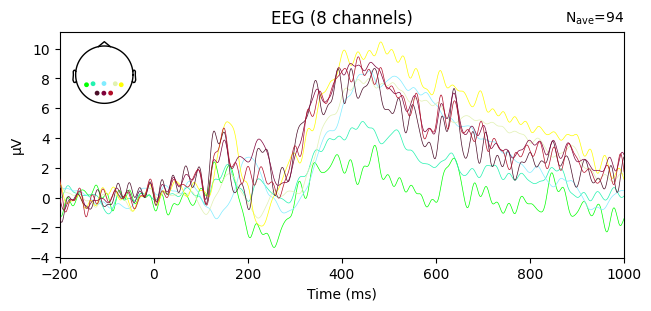

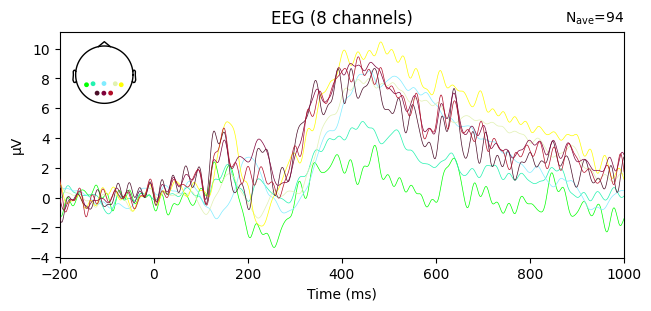

In [811]:
#Word_selected = Word.pick_channels(["Oz"])
#Word_selected_evoked = Word_selected.average()
#evoked_selected = epochs_selected.average()
Word_evoked.plot(time_unit='ms', picks=["P7", "P3","Pz", "P4", "P8", "O1", "Oz", "O2"])

#Word_evoked.plot(time_unit='ms')

# Statistics 


## 1. Basic Stats

#### Stimulus Only

In [ ]:
# epochs for Word Congruent and Word Incongruent conditions in epochs_1
word_congruent_epochs_1 = epochs_1["Word/Congruent"]
word_incongruent_epochs_1 = epochs_1["Word/Incongruent"]

# epochs based on prediction correctness in epochs_1
correct_prediction_epochs_1 = epochs_1[correct_indices]
incorrect_prediction_epochs_1 = epochs_1[incorrect_indices]

# epochs for Stable and Volatile Word conditions in epochs_1
stable_word_epochs_1 = epochs_1["Stable/Word"]
volatile_word_epochs_1 = epochs_1["Volatile/Word"]

# epochs CORRECT: Stable vs Volatile in epochs_1
stable_correct_indices_1 = [idx for idx in correct_indices if events_1[idx][2] in (
    event_id_1['Stable/Word/Animal/Congruent'], event_id_1['Stable/Word/Animal/Incongruent'],
    event_id_1['Stable/Word/Tool/Congruent'], event_id_1['Stable/Word/Tool/Incongruent'])]

volatile_correct_indices_1 = [idx for idx in correct_indices if events_1[idx][2] in (
    event_id_1['Volatile/Word/Animal/Congruent'], event_id_1['Volatile/Word/Animal/Incongruent'],
    event_id_1['Volatile/Word/Tool/Congruent'], event_id_1['Volatile/Word/Tool/Incongruent'])]

stable_correct_prediction_epochs_1 = epochs_1[stable_correct_indices_1]
volatile_correct_prediction_epochs_1 = epochs_1[volatile_correct_indices_1]

# epochs INCORRECT: Stable vs Volatile in epochs_1
stable_incorrect_prediction_epochs_1 = epochs_1[stable_incorrect_indices]
volatile_incorrect_prediction_epochs_1 = epochs_1[volatile_incorrect_indices]

# Stable: Correct vs Incorrect in epochs_1
stable_correct_prediction_epochs_1 = epochs_1[stable_correct_indices_1]
stable_incorrect_prediction_epochs_1 = epochs_1[stable_incorrect_indices]

# Volatile: Correct vs Incorrect in epochs_1
volatile_correct_prediction_epochs_1 = epochs_1[volatile_correct_indices_1]
volatile_incorrect_prediction_epochs_1 = epochs_1[volatile_incorrect_indices]

#### N400

In [788]:
# chosen channels
picks = ["F7", "F3","Fz", "F4", "F8"]

# time window in seconds
tmin = 0.3
tmax = 0.5

In [ ]:
from scipy import stats

conditions = {
    "Word Congruent vs Incongruent": (epochs_1["Word/Congruent"], epochs_1["Word/Incongruent"]),
    "Correct vs Incorrect": (epochs_1[correct_indices], epochs_1[incorrect_indices]),
    "Stable vs Volatile Word": (epochs_1["Stable/Word"], epochs_1["Volatile/Word"]),
    "Stable Correct vs Volatile Correct": (epochs_1[stable_correct_indices_1], epochs_1[volatile_correct_indices_1]),
    "Stable Incorrect vs Volatile Incorrect": (epochs_1[stable_incorrect_indices], epochs_1[volatile_incorrect_indices]),
    "Stable Correct vs Incorrect": (epochs_1[stable_correct_indices_1], epochs_1[stable_incorrect_indices]),
    "Volatile Correct vs Incorrect": (epochs_1[volatile_correct_indices_1], epochs_1[volatile_incorrect_indices])
}

# Run the t-tests
results = run_t_tests(epochs_1, conditions, picks, tmin, tmax, "P600")

for condition_name, (t_stat, p_value) in results.items():
    print(f"{condition_name}: T-statistic = {t_stat}, P-value = {p_value}")

In [792]:
from scipy import stats

def run_t_tests(epochs, conditions, picks, tmin, tmax, component_name):
    results = {}
    
    for condition_name, (condition1, condition2) in conditions.items():

        data_condition1 = condition1.get_data(picks=picks, tmin=tmin, tmax=tmax)
        data_condition2 = condition2.get_data(picks=picks, tmin=tmin, tmax=tmax)
        
        # Compute the mean 
        data_condition1_mean = np.mean(data_condition1, axis=(1, 2))
        data_condition2_mean = np.mean(data_condition2, axis=(1, 2))
        
        # Perform t-test
        t_stat, p_value = stats.ttest_ind(data_condition1_mean, data_condition2_mean)
        
        # Calculate degrees of freedom
        df = len(data_condition1_mean) + len(data_condition2_mean) - 2
        
        # Calculate Cohen's d
        std1 = np.std(data_condition1_mean, ddof=1)
        std2 = np.std(data_condition2_mean, ddof=1)
        pooled_std = np.sqrt(((len(data_condition1_mean) - 1) * std1**2 + (len(data_condition2_mean) - 1) * std2**2) / df)
        cohen_d = (np.mean(data_condition1_mean) - np.mean(data_condition2_mean)) / pooled_std
        
        results[condition_name] = {
            "t_stat": t_stat,
            "p_value": p_value,
            "df": df,
            "cohen_d": cohen_d
        }
    
    return results

conditions = {
    "Word Congruent vs Incongruent": (epochs_1["Word/Congruent"], epochs_1["Word/Incongruent"]),
    "Correct vs Incorrect": (epochs_1[correct_indices], epochs_1[incorrect_indices]),
    "Stable vs Volatile Word": (epochs_1["Stable/Word"], epochs_1["Volatile/Word"]),
    "Stable Correct vs Volatile Correct": (epochs_1[stable_correct_indices_1], epochs_1[volatile_correct_indices_1]),
    "Stable Incorrect vs Volatile Incorrect": (epochs_1[stable_incorrect_indices], epochs_1[volatile_incorrect_indices]),
    "Stable Correct vs Incorrect": (epochs_1[stable_correct_indices_1], epochs_1[stable_incorrect_indices]),
    "Volatile Correct vs Incorrect": (epochs_1[volatile_correct_indices_1], epochs_1[volatile_incorrect_indices])
}

picks = ["F7", "F3","Fz", "F4", "F8"]

tmin = 0.3
tmax = 0.5

results_n400 = run_t_tests(epochs_1, conditions, picks, tmin, tmax, "P600")

for condition_name, stats in results_n400.items():
    print(f"{condition_name}:")
    print(f"  T-statistic = {stats['t_stat']:.4f}")
    print(f"  P-value = {stats['p_value']:}")
    print(f"  Degrees of Freedom = {stats['df']}")
    print(f"  Cohen's d = {stats['cohen_d']:.4f}")
    print()

Word Congruent vs Incongruent:
  T-statistic = 2.4908
  P-value = 0.014540369165933294
  Degrees of Freedom = 92
  Cohen's d = 0.5422

Correct vs Incorrect:
  T-statistic = 0.9808
  P-value = 0.3292775579745383
  Degrees of Freedom = 92
  Cohen's d = 0.2692

Stable vs Volatile Word:
  T-statistic = 0.6248
  P-value = 0.533622834744524
  Degrees of Freedom = 92
  Cohen's d = 0.1289

Stable Correct vs Volatile Correct:
  T-statistic = 0.4712
  P-value = 0.6388523922962362
  Degrees of Freedom = 76
  Cohen's d = 0.1067

Stable Incorrect vs Volatile Incorrect:
  T-statistic = 0.3690
  P-value = 0.7176314993307096
  Degrees of Freedom = 14
  Cohen's d = 0.1860

Stable Correct vs Incorrect:
  T-statistic = 0.5934
  P-value = 0.5559542136200508
  Degrees of Freedom = 44
  Cohen's d = 0.2436

Volatile Correct vs Incorrect:
  T-statistic = 0.7266
  P-value = 0.47112465195177466
  Degrees of Freedom = 46
  Cohen's d = 0.2687



In [793]:
data_word_congruent_epochs_1 = word_congruent_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_word_incongruent_epochs_1 = word_incongruent_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_word_congruent_mean_1 = np.mean(data_word_congruent_epochs_1, axis=(1, 2))
print(data_word_congruent_mean_1.shape)

data_word_incongruent_mean_1 = np.mean(data_word_incongruent_epochs_1, axis=(1, 2))
print(data_word_incongruent_mean_1.shape)

(62,)
(32,)


In [794]:
len(data_word_incongruent_epochs_1)

32

In [795]:
from scipy import stats
stats.ttest_ind(data_word_congruent_mean_1, data_word_incongruent_mean_1)

TtestResult(statistic=2.490764772654941, pvalue=0.014540369165933294, df=92.0)

C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\3287357220.py:4: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_congruent_1 = word_congruent_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_congruent_epochs_1.get_data().shape[0])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\3287357220.py:5: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_incongruent_1 = word_incongruent_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_incongruent_epochs_1.get_data().shape[0])


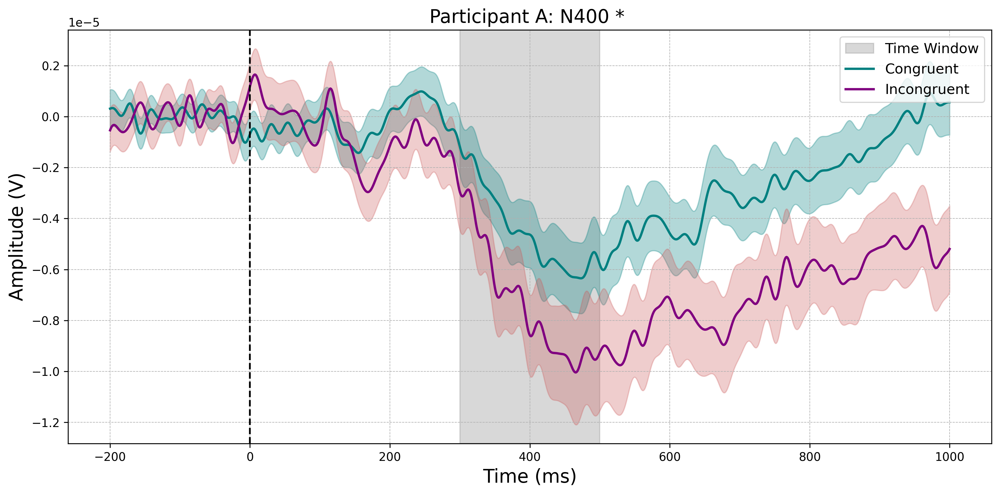

In [796]:
plot_data_congruent_1 = word_congruent_epochs_1.get_data(copy=True, picks = picks).mean(axis=(0, 1))
plot_data_incongruent_1 = word_incongruent_epochs_1.get_data(copy=True, picks = picks).mean(axis=(0, 1))

std_error_congruent_1 = word_congruent_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_congruent_epochs_1.get_data().shape[0])
std_error_incongruent_1 = word_incongruent_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_incongruent_epochs_1.get_data().shape[0])


times = word_congruent_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.3, label="Time Window")

ax.plot(times, plot_data_congruent_1, label="Congruent", linewidth=2, color="teal")
ax.fill_between(times, plot_data_congruent_1 - std_error_congruent_1, plot_data_congruent_1 + std_error_congruent_1, color="teal", alpha=0.3)
ax.plot(times, plot_data_incongruent_1, label="Incongruent", linewidth=2, color="purple")
ax.fill_between(times, plot_data_incongruent_1 - std_error_incongruent_1, plot_data_incongruent_1 + std_error_incongruent_1, color="indianred", alpha=0.3)

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=16)
ax.set_ylabel("Amplitude (V)", fontsize=16)
ax.set_title("Participant A: N400 * ", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

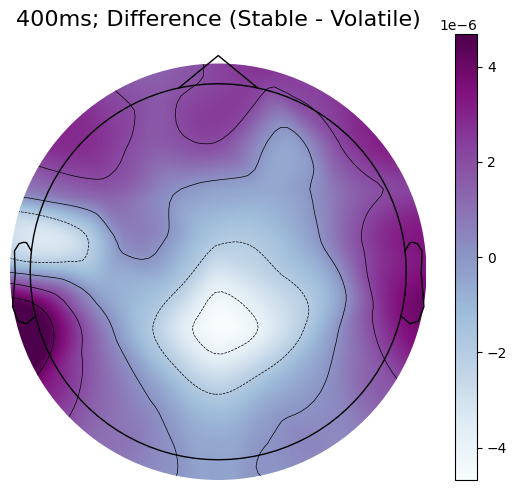

In [797]:
word_congruent_epochs_1 = epochs_1["Word/Congruent"]
word_incongruent_epochs_1 = epochs_1["Word/Incongruent"]

evoked_stable = stable_word_epochs_1.average()
evoked_volatile = volatile_word_epochs_1.average()

evoked_diff = mne.combine_evoked([evoked_stable, evoked_volatile], weights=[1, -1])

timepoint = 0.4  

fig, ax = plt.subplots(figsize=(6, 5))

im, _ = mne.viz.plot_topomap(evoked_diff.data[:, evoked_diff.time_as_index(timepoint)[0]],
                             evoked_diff.info, axes=ax, show=False, sensors=False, cmap='BuPu')

cbar = plt.colorbar(im, ax=ax, orientation='vertical')


ax.set_title('400ms; Difference (Stable - Volatile)', fontsize=16)

plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"


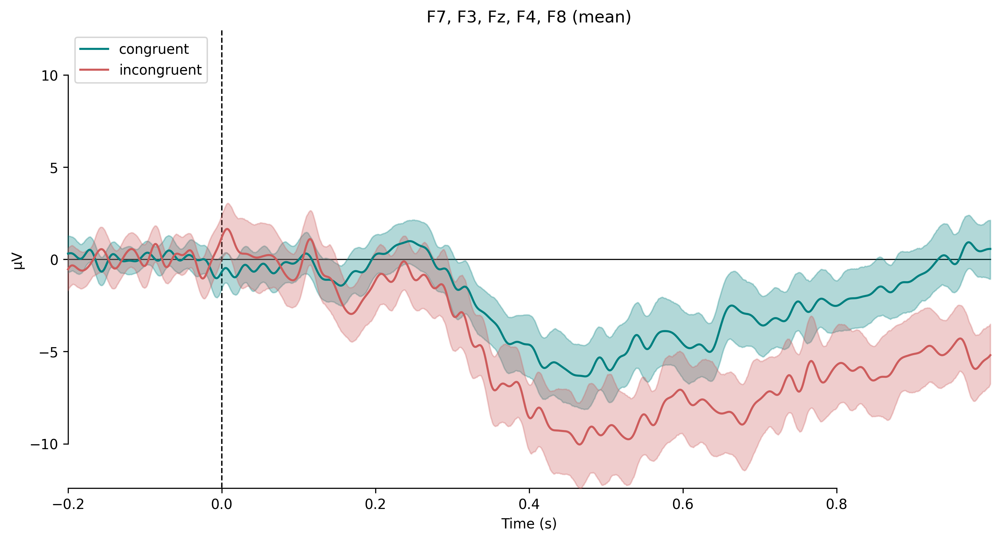

<Figure size 640x480 with 0 Axes>

In [798]:
evokeds = dict(
    congruent=list(word_congruent_epochs_1.iter_evoked()),
    incongruent=list(word_incongruent_epochs_1.iter_evoked()),
)

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

colors = dict(congruent='teal', incongruent='indianred')
mne.viz.plot_compare_evokeds(evokeds, combine="mean", picks=picks, ci=True, colors=colors, axes=ax)

xmin, xmax = ax.get_xlim()
if xmin > 0.3 * 1000 or xmax < 0.5 * 1000:
    ax.set_xlim(left=-200, right=1000)

ax.axvspan(300, 500, color="grey", alpha=0.3, label="0.3-0.5 s Window")

ax.axvline(x=0, color="black", linestyle="--", linewidth=1.5, label="Button Press")
ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("ERP: Congruent vs Incongruent Conditions", fontsize=16)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys(), loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [799]:
data_correct_prediction_epochs_1 = correct_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_incorrect_prediction_epochs_1 = incorrect_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_correct_prediction_mean_1 = np.mean(data_correct_prediction_epochs_1, axis=(1, 2))
print(data_correct_prediction_mean_1.shape)

data_incorrect_prediction_mean_1 = np.mean(data_incorrect_prediction_epochs_1, axis=(1, 2))
print(data_incorrect_prediction_mean_1.shape)

t_stat, p_value = stats.ttest_ind(data_correct_prediction_mean_1, data_incorrect_prediction_mean_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(78,)
(16,)
T-statistic: 0.9807715358414176, P-value: 0.3292775579745383


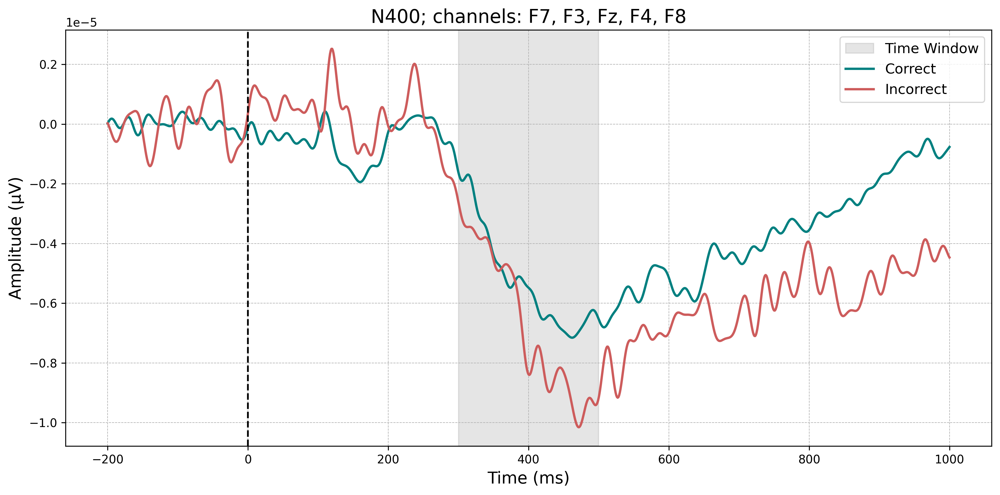

In [800]:
plot_data_correct_1 = correct_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_incorrect_1 = incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = correct_prediction_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_correct_1, label="Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_incorrect_1, label="Incorrect", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [801]:
data_stable_word_epochs_1 = stable_word_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_word_epochs_1 = volatile_word_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_word_mean_1 = np.mean(data_stable_word_epochs_1, axis=(1, 2))
print(data_stable_word_mean_1.shape)

data_volatile_word_mean_1 = np.mean(data_volatile_word_epochs_1, axis=(1, 2))
print(data_volatile_word_mean_1.shape)

t_stat, p_value = stats.ttest_ind(data_stable_word_mean_1, data_volatile_word_mean_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(46,)
(48,)
T-statistic: 0.624839854975015, P-value: 0.533622834744524


C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\850167023.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_stable_1 = stable_word_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_word_epochs_1.get_data().shape[0])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\850167023.py:5: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_volatile_1 = volatile_word_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(volatile_word_epochs_1.get_data().shape[0])


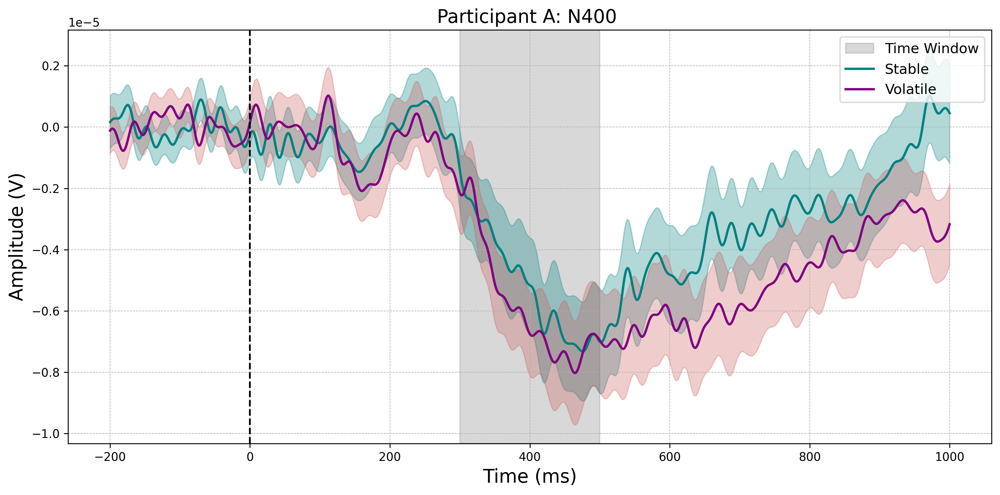

In [802]:
plot_data_stable_1 = stable_word_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_stable_1 = stable_word_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_word_epochs_1.get_data().shape[0])

plot_data_volatile_1 = volatile_word_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_volatile_1 = volatile_word_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(volatile_word_epochs_1.get_data().shape[0])

times = stable_word_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.3, label="Time Window")

ax.plot(times, plot_data_stable_1, label="Stable", linewidth=2, color="teal")
ax.fill_between(times, plot_data_stable_1 - std_error_stable_1, plot_data_stable_1 + std_error_stable_1, color="teal", alpha=0.3)

ax.plot(times, plot_data_volatile_1, label="Volatile", linewidth=2, color="purple")
ax.fill_between(times, plot_data_volatile_1 - std_error_volatile_1, plot_data_volatile_1 + std_error_volatile_1, color="indianred", alpha=0.3)

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=16)
ax.set_ylabel("Amplitude (V)", fontsize=16)  
ax.set_title("Participant A: N400 ", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [803]:
data_stable_correct_prediction_epochs_1 = stable_correct_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_correct_prediction_epochs_1 = volatile_correct_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_correct_mean_1 = np.mean(data_stable_correct_prediction_epochs_1, axis=(1, 2))
print(data_stable_correct_mean_1.shape)

data_volatile_correct_mean_1 = np.mean(data_volatile_correct_prediction_epochs_1, axis=(1, 2))
print(data_volatile_correct_mean_1.shape)

t_stat, p_value = stats.ttest_ind(data_stable_correct_mean_1, data_volatile_correct_mean_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(39,)
(39,)
T-statistic: 0.47119341887878025, P-value: 0.6388523922962362


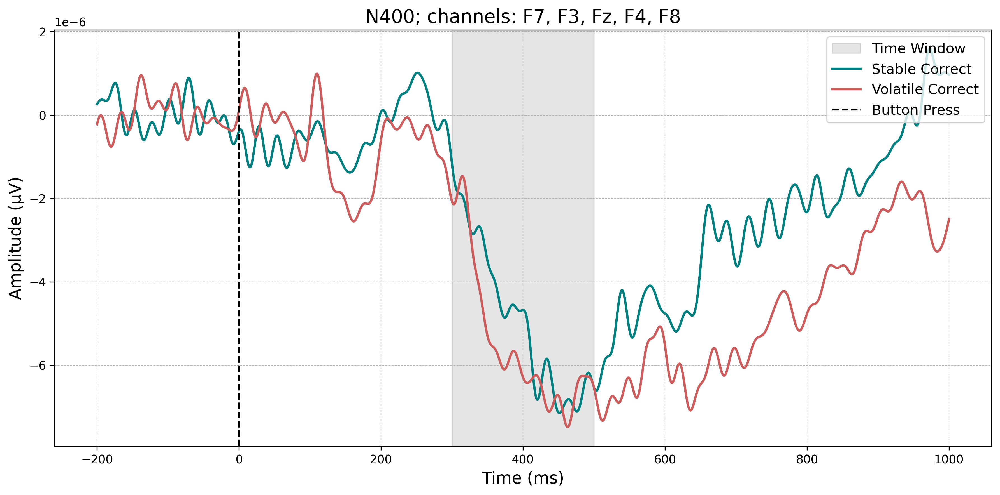

In [804]:
plot_data_stable_correct_1 = stable_correct_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_volatile_correct_1 = volatile_correct_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = stable_correct_prediction_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_stable_correct_1, label="Stable Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_volatile_correct_1, label="Volatile Correct", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="Button Press", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [805]:
data_stable_incorrect_prediction_epochs_1 = stable_incorrect_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_incorrect_prediction_epochs_1 = volatile_incorrect_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_incorrect_mean_1 = np.mean(data_stable_incorrect_prediction_epochs_1, axis=(1, 2))
print(data_stable_incorrect_mean_1.shape)

data_volatile_incorrect_mean_1 = np.mean(data_volatile_incorrect_prediction_epochs_1, axis=(1, 2))
print(data_volatile_incorrect_mean_1.shape)

t_stat, p_value = stats.ttest_ind(data_stable_incorrect_mean_1, data_volatile_incorrect_mean_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(7,)
(9,)
T-statistic: 0.36902329219455976, P-value: 0.7176314993307096


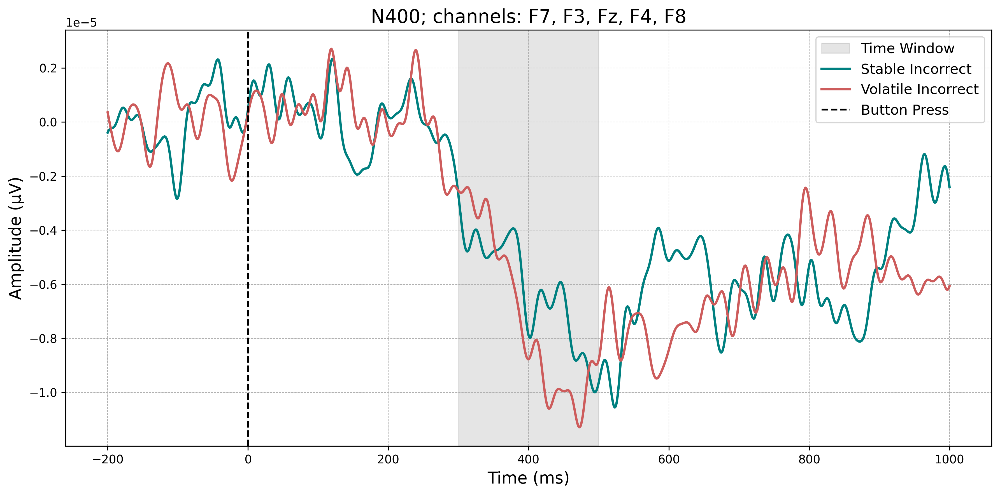

In [806]:
plot_data_stable_incorrect_1 = stable_incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_volatile_incorrect_1 = volatile_incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = stable_incorrect_prediction_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_stable_incorrect_1, label="Stable Incorrect", linewidth=2, color="teal")
ax.plot(times, plot_data_volatile_incorrect_1, label="Volatile Incorrect", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="Button Press", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [807]:
data_stable_correct_prediction_epochs_1 = stable_correct_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_stable_incorrect_prediction_epochs_1 = stable_incorrect_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_correct_mean_1 = np.mean(data_stable_correct_prediction_epochs_1, axis=(1, 2))
print(data_stable_correct_mean_1.shape)

data_stable_incorrect_mean_1 = np.mean(data_stable_incorrect_prediction_epochs_1, axis=(1, 2))
print(data_stable_incorrect_mean_1.shape)

t_stat, p_value = stats.ttest_ind(data_stable_correct_mean_1, data_stable_incorrect_mean_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(39,)
(7,)
T-statistic: 0.59339631225172, P-value: 0.5559542136200508


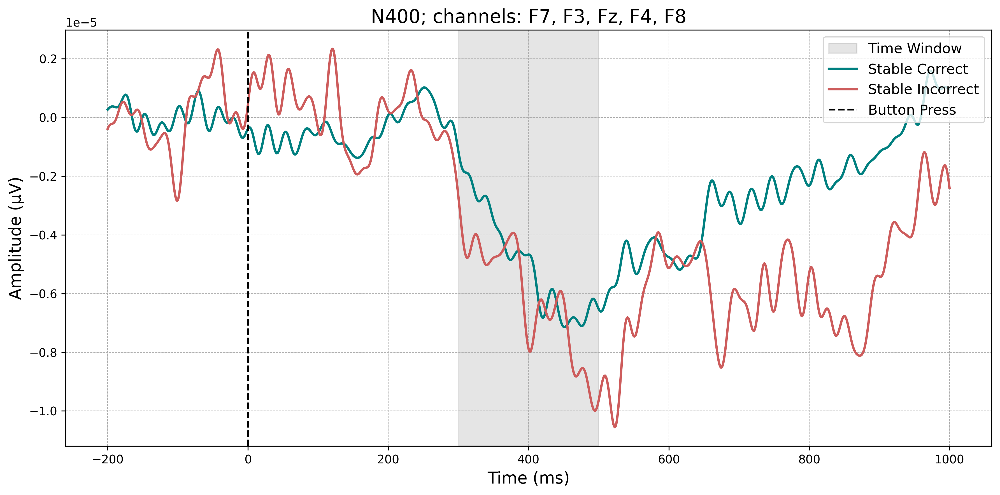

In [808]:
plot_data_stable_correct_1 = stable_correct_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_stable_incorrect_1 = stable_incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = stable_correct_prediction_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_stable_correct_1, label="Stable Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_stable_incorrect_1, label="Stable Incorrect", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="Button Press", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [809]:
data_volatile_correct_prediction_epochs_1 = volatile_correct_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_incorrect_prediction_epochs_1 = volatile_incorrect_prediction_epochs_1.get_data(picks=picks, tmin=tmin, tmax=tmax)

# Compute the mean for volatile correct prediction epochs (averaging over time and channels)
data_volatile_correct_mean_1 = np.mean(data_volatile_correct_prediction_epochs_1, axis=(1, 2))
print(data_volatile_correct_mean_1.shape)

# Compute the mean for volatile incorrect prediction epochs (averaging over time and channels)
data_volatile_incorrect_mean_1 = np.mean(data_volatile_incorrect_prediction_epochs_1, axis=(1, 2))
print(data_volatile_incorrect_mean_1.shape)

t_stat, p_value = stats.ttest_ind(data_volatile_correct_mean_1, data_volatile_incorrect_mean_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(39,)
(9,)
T-statistic: 0.7266458679041737, P-value: 0.47112465195177466


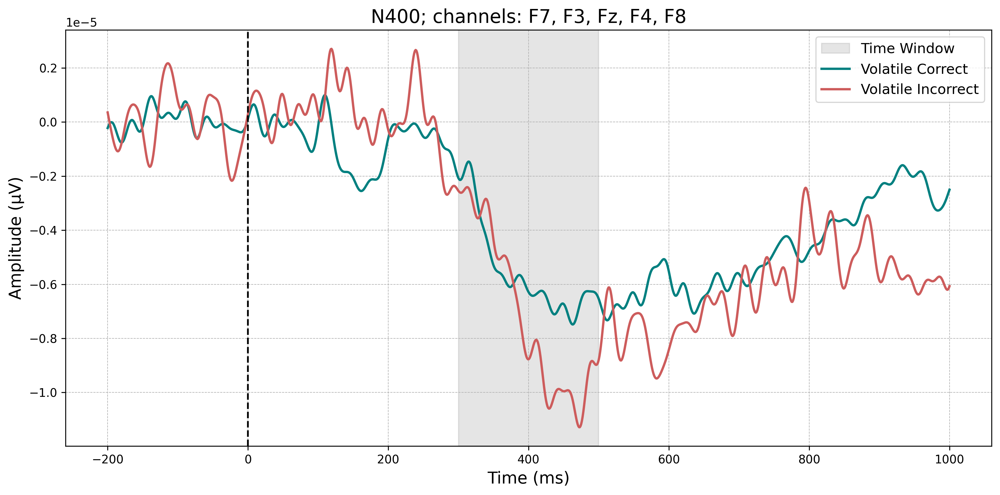

In [810]:
plot_data_volatile_correct_1 = volatile_correct_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_volatile_incorrect_1 = volatile_incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = volatile_correct_prediction_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_volatile_correct_1, label="Volatile Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_volatile_incorrect_1, label="Volatile Incorrect", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

#### P600

In [757]:
picks = [ "P3","Pz", "P4"]

tmin = 0.5
tmax = 1.0

In [758]:
def run_t_tests(epochs, conditions, picks, tmin, tmax, component_name):
    results = {}
    
    for condition_name, (condition1, condition2) in conditions.items():
        data_condition1 = condition1.get_data(picks=picks, tmin=tmin, tmax=tmax)
        data_condition2 = condition2.get_data(picks=picks, tmin=tmin, tmax=tmax)
        
        data_condition1_mean = np.mean(data_condition1, axis=(1, 2))
        data_condition2_mean = np.mean(data_condition2, axis=(1, 2))
        
        t_stat, p_value = stats.ttest_ind(data_condition1_mean, data_condition2_mean)
        results[condition_name] = (t_stat, p_value)
    
    return results

In [759]:
conditions = {
    "Word Congruent vs Incongruent": (epochs_1["Word/Congruent"], epochs_1["Word/Incongruent"]),
    "Correct vs Incorrect": (epochs_1[correct_indices], epochs_1[incorrect_indices]),
    "Stable vs Volatile Word": (epochs_1["Stable/Word"], epochs_1["Volatile/Word"]),
    "Stable Correct vs Volatile Correct": (epochs_1[stable_correct_indices_1], epochs_1[volatile_correct_indices_1]),
    "Stable Incorrect vs Volatile Incorrect": (epochs_1[stable_incorrect_indices], epochs_1[volatile_incorrect_indices]),
    "Stable Correct vs Incorrect": (epochs_1[stable_correct_indices_1], epochs_1[stable_incorrect_indices]),
    "Volatile Correct vs Incorrect": (epochs_1[volatile_correct_indices_1], epochs_1[volatile_incorrect_indices])
}

results = run_t_tests(epochs_1, conditions, picks, tmin, tmax, "P600")

for condition_name, (t_stat, p_value) in results.items():
    print(f"{condition_name}: T-statistic = {t_stat}, P-value = {p_value}")

Word Congruent vs Incongruent: T-statistic = -4.300690901607436, P-value = 4.233875817299511e-05
Correct vs Incorrect: T-statistic = -1.6028562183225787, P-value = 0.11239435550964552
Stable vs Volatile Word: T-statistic = -2.020458656655225, P-value = 0.046243386659796264
Stable Correct vs Volatile Correct: T-statistic = -2.185024574383402, P-value = 0.03196894581387108
Stable Incorrect vs Volatile Incorrect: T-statistic = 0.2782526382495936, P-value = 0.784885802453629
Stable Correct vs Incorrect: T-statistic = -2.0395848240152983, P-value = 0.04742437201337797
Volatile Correct vs Incorrect: T-statistic = -0.3586854758023957, P-value = 0.7214714436183648


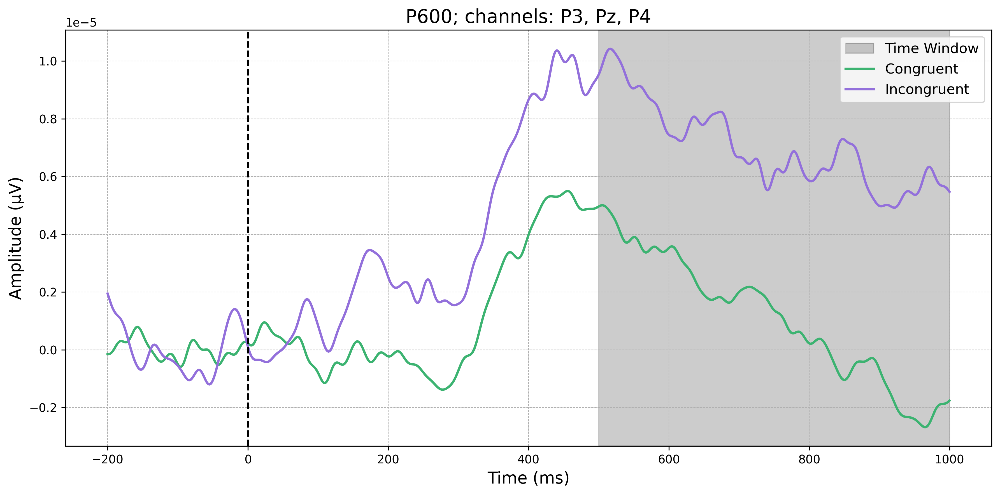

In [760]:
import numpy as np
import matplotlib.pyplot as plt

plot_data_congruent_1 = word_congruent_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_incongruent_1 = word_incongruent_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = word_congruent_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="black", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_congruent_1, label="Congruent", linewidth=2, color="mediumseagreen")
ax.plot(times, plot_data_incongruent_1, label="Incongruent", linewidth=2, color="mediumpurple")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("P600; channels: P3, Pz, P4", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"


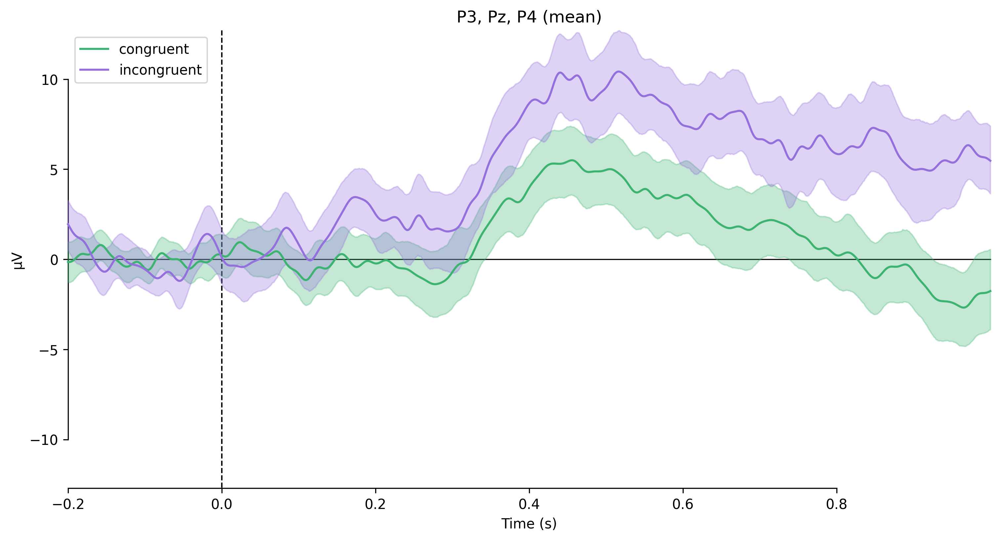

<Figure size 640x480 with 0 Axes>

In [761]:
evokeds = dict(
    congruent=list(word_congruent_epochs_1.iter_evoked()),
    incongruent=list(word_incongruent_epochs_1.iter_evoked()),
)

tmin_grey, tmax_grey = 300, 500

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

colors = dict(congruent='mediumseagreen', incongruent='mediumpurple')
mne.viz.plot_compare_evokeds(evokeds, combine="mean", picks=picks, ci=True, colors=colors, axes=ax)

ax.axvspan(tmin_grey, tmax_grey, color="grey", alpha=0.2, label="300-500 ms Window")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)
ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("ERP: Congruent vs Incongruent Conditions", fontsize=16)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\1179068369.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_stable_correct = stable_correct_prediction_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_correct_prediction_epochs_1.get_data().shape[0])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_1436\1179068369.py:5: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_stable_incorrect = stable_incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_incorrect_prediction_epochs_1.get_data().shape[0])


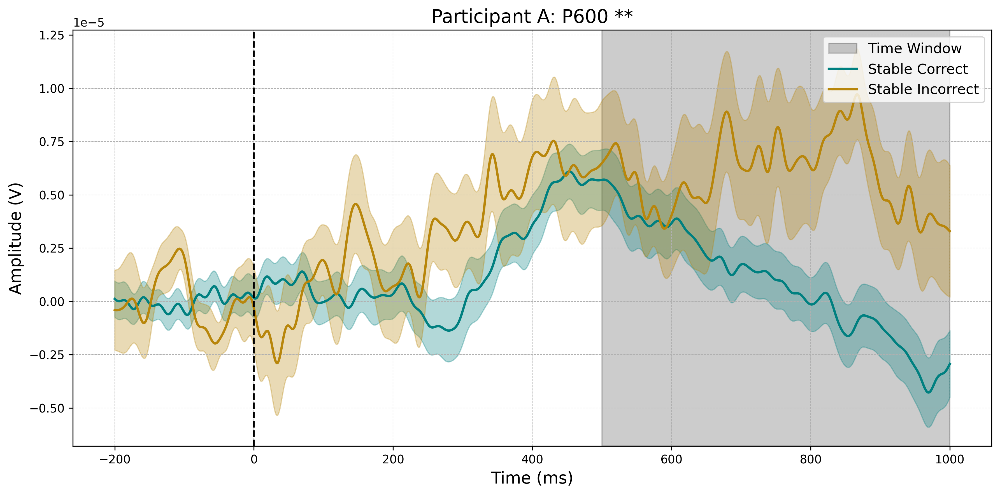

In [762]:
plot_data_stable_correct = stable_correct_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_stable_correct = stable_correct_prediction_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_correct_prediction_epochs_1.get_data().shape[0])

plot_data_stable_incorrect = stable_incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_stable_incorrect = stable_incorrect_prediction_epochs_1.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_incorrect_prediction_epochs_1.get_data().shape[0])

times = stable_correct_prediction_epochs_1.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="black", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_stable_correct, label="Stable Correct", linewidth=2, color="teal")
ax.fill_between(times, plot_data_stable_correct - std_error_stable_correct, plot_data_stable_correct + std_error_stable_correct, color="teal", alpha=0.3)

ax.plot(times, plot_data_stable_incorrect, label="Stable Incorrect", linewidth=2, color="darkgoldenrod")
ax.fill_between(times, plot_data_stable_incorrect - std_error_stable_incorrect, plot_data_stable_incorrect + std_error_stable_incorrect, color="darkgoldenrod", alpha=0.3)

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (V)", fontsize=14)  # Adjust if your data is in volts
ax.set_title("Participant A: P600 **", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

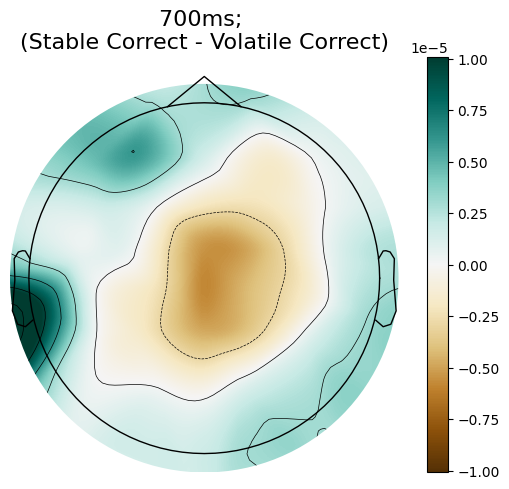

In [763]:
evoked_stable_correct = stable_correct_prediction_epochs_1.average()
evoked_volatile_correct = volatile_correct_prediction_epochs_1.average()

evoked_diff = mne.combine_evoked([evoked_stable_correct, evoked_volatile_correct], weights=[1, -1])

time_of_interest_ms = 700  
time_of_interest = time_of_interest_ms / 1000  

fig, ax = plt.subplots(figsize=(6, 5))

im, _ = mne.viz.plot_topomap(evoked_diff.data[:, evoked_diff.time_as_index(time_of_interest)[0]],
                             evoked_diff.info, axes=ax, show=False, sensors=False, cmap='BrBG')

cbar = plt.colorbar(im, ax=ax, orientation='vertical')

ax.set_title(f'700ms; \n(Stable Correct - Volatile Correct)', fontsize=16)

plt.tight_layout()
plt.show()

## Precision Weighted Prediction Errors

In [ ]:
pwPE_1_xprob = pd.read_csv("..\pwPredictionErrors\pwPE_1_xprob.csv")
pwPE_1_xvol = pd.read_csv("..\pwPredictionErrors\pwPE_1_xvol.csv")


In [ ]:
print(pwPE_1_xprob.head())

In [ ]:
n400_picks = ["F7", "F3", "Fz", "F4", "F8"]
p600_picks = ["P3", "Pz", "P4"]

n400_time_window = (0.3, 0.5)
p600_time_window = (0.6, 1.0)

n400_data = epochs_1["Word"].copy().pick_channels(n400_picks).crop(tmin=n400_time_window[0], tmax=n400_time_window[1]).get_data()
p600_data = epochs_1["Word"].copy().pick_channels(p600_picks).crop(tmin=p600_time_window[0], tmax=p600_time_window[1]).get_data()

n400_averages = n400_data.mean(axis=-1).mean(axis=1)
p600_averages = p600_data.mean(axis=-1).mean(axis=1)

In [ ]:
pwPE_1_xprob = pwPE_1_xprob.dropna()
pwPE_1_xvol = pwPE_1_xvol.dropna()


In [ ]:
pwPE_1_xprob['epoch'] = pwPE_1_xprob['epoch'].astype(int)
pwPE_1_xvol['epoch'] = pwPE_1_xvol['epoch'].astype(int)


In [ ]:
pwPE_xprob = pwPE_1_xprob['average']
pwPE_xvol = pwPE_1_xvol['average']
epoch = pwPE_1_xprob['epoch']


In [ ]:
pwPE_1_df = pd.DataFrame({
    'epoch': pwPE_1_xprob['epoch'].astype(int), 
    'pwPE_xprob': pwPE_1_xprob['average'],      
    'pwPE_xvol': pwPE_1_xvol['average']        
})

In [ ]:
pwPE_1_df['N400_average'] = n400_averages
pwPE_1_df['P600_average'] = p600_averages

In [ ]:
import csv
csv_filename = 'pwPE_1_data.csv'

fieldnames = pwPE_1_df.columns.tolist()

with open(csv_filename, mode='w', newline='') as file:
    writer = csv.writer(file)
    
    writer.writerow(fieldnames)
    
    for row in pwPE_1_df.itertuples(index=False, name=None):
        writer.writerow(row)

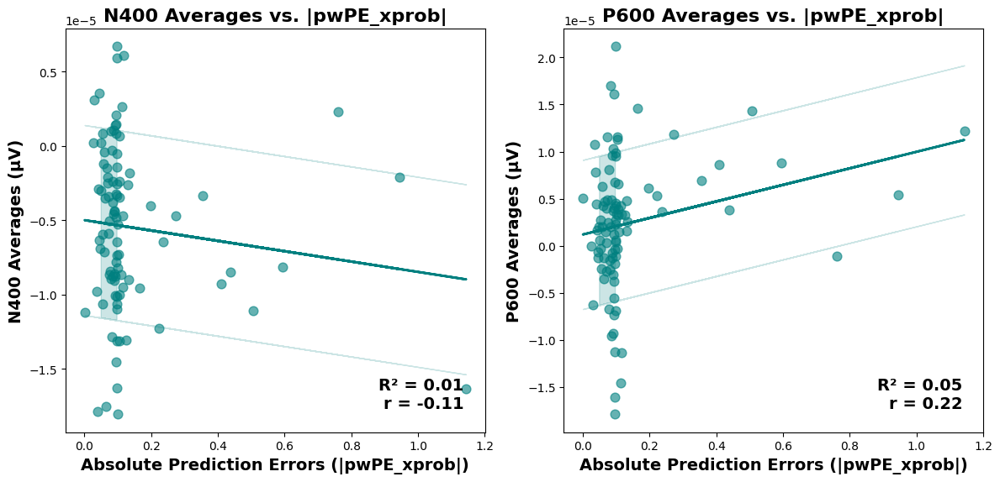

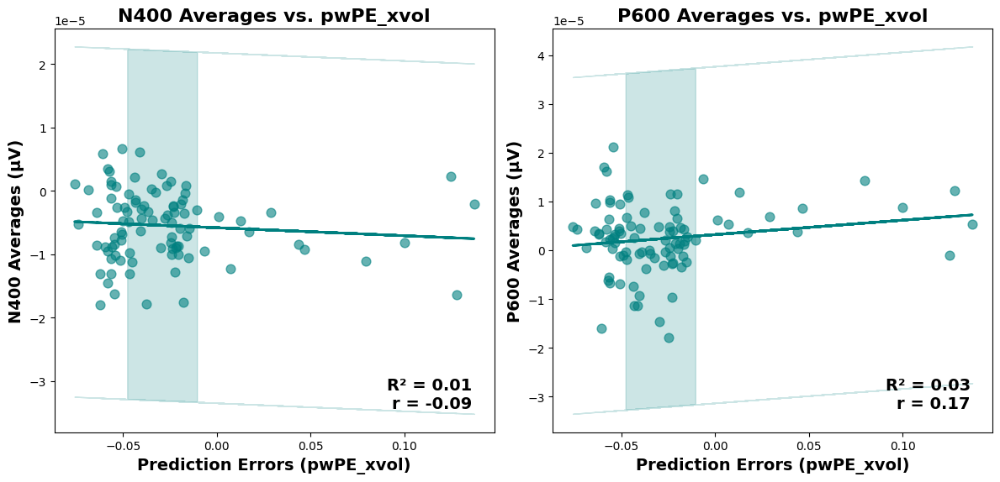

In [764]:
from sklearn.linear_model import LinearRegression
from scipy import stats


def add_regression_line_with_uncertainty(x, y, ax, line_color='teal', cloud_color='teal'):
    x = x.values.reshape(-1, 1)
    y = y.values.reshape(-1, 1)

    model = LinearRegression().fit(x, y)
    y_pred = model.predict(x)

    ax.plot(x, y_pred, color=line_color, linewidth=2, label='Regression Line')
    n = len(x)
    mean_x = np.mean(x)
    t_val = stats.t.ppf(0.975, df=n-2)  # 95% confidence interval
    se = np.sqrt(np.sum((y - y_pred)**2) / (n - 2)) / np.sqrt(np.sum((x - mean_x)**2))
    ci_upper = y_pred + t_val * se
    ci_lower = y_pred - t_val * se

    ax.fill_between(x.flatten(), ci_lower.flatten(), ci_upper.flatten(), color=cloud_color, alpha=0.2, label='95% Confidence Interval')
    # Add R² 
    r2_score = model.score(x, y)
    r_score = np.corrcoef(x.flatten(), y.flatten())[0, 1]
    ax.text(0.95, 0.05, f'R² = {r2_score:.2f}\nr = {r_score:.2f}', transform=ax.transAxes,
            fontsize=14, fontweight='bold', verticalalignment='bottom', horizontalalignment='right')

# Plot for pwPE_xprob (absolute)
plt.figure(figsize=(12, 6))

# N400 vs. Absolute pwPE_xprob
ax1 = plt.subplot(1, 2, 1)
ax1.scatter(pwPE_xprob_abs, pwPE_1_df['N400_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax1.set_title('N400 Averages vs. |pwPE_xprob|', fontsize=16, fontweight='bold')
ax1.set_xlabel('Absolute Prediction Errors (|pwPE_xprob|)', fontsize=14, fontweight='bold')
ax1.set_ylabel('N400 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_xprob_abs, pwPE_1_df['N400_average'], ax1, line_color='teal', cloud_color='teal')

# P600 vs. Absolute pwPE_xprob
ax2 = plt.subplot(1, 2, 2)
ax2.scatter(pwPE_xprob_abs, pwPE_1_df['P600_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax2.set_title('P600 Averages vs. |pwPE_xprob|', fontsize=16, fontweight='bold')
ax2.set_xlabel('Absolute Prediction Errors (|pwPE_xprob|)', fontsize=14, fontweight='bold')
ax2.set_ylabel('P600 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_xprob_abs, pwPE_1_df['P600_average'], ax2, line_color='teal', cloud_color='teal')

plt.tight_layout()
plt.show()

# pwPE_xvol
plt.figure(figsize=(12, 6))

# N400 vs. pwPE_xvol
ax3 = plt.subplot(1, 2, 1)
ax3.scatter(pwPE_1_df['pwPE_xvol'], pwPE_1_df['N400_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax3.set_title('N400 Averages vs. pwPE_xvol', fontsize=16, fontweight='bold')
ax3.set_xlabel('Prediction Errors (pwPE_xvol)', fontsize=14, fontweight='bold')
ax3.set_ylabel('N400 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_1_df['pwPE_xvol'], pwPE_1_df['N400_average'], ax3, line_color='teal', cloud_color='teal')

# P600 vs. pwPE_xvol
ax4 = plt.subplot(1, 2, 2)
ax4.scatter(pwPE_1_df['pwPE_xvol'], pwPE_1_df['P600_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax4.set_title('P600 Averages vs. pwPE_xvol', fontsize=16, fontweight='bold')
ax4.set_xlabel('Prediction Errors (pwPE_xvol)', fontsize=14, fontweight='bold')
ax4.set_ylabel('P600 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_1_df['pwPE_xvol'], pwPE_1_df['P600_average'], ax4, line_color='teal', cloud_color='teal')

plt.tight_layout()
plt.show()

In [744]:
import statsmodels.api as sm

# absolute values for pwPE_xprob
pwPE_xprob_abs = np.abs(pwPE_1_df['pwPE_xprob'])

X_combined = pd.DataFrame({
    'pwPE_xprob_abs': pwPE_xprob_abs,
    'pwPE_xvol': pwPE_1_df['pwPE_xvol']
})

X_combined = sm.add_constant(X_combined)

# Model 1: N400 as outcome using GLM with Gaussian family
model_n400_combined_glm = sm.GLM(pwPE_1_df['N400_average'], X_combined, family=sm.families.Gaussian()).fit()

print("N400 vs. Absolute pwPE_xprob and pwPE_xvol (GLM):")
print(model_n400_combined_glm.summary())

# Model 2: P600 as outcome using GLM with Gaussian family
model_p600_combined_glm = sm.GLM(pwPE_1_df['P600_average'], X_combined, family=sm.families.Gaussian()).fit()

print("\nP600 vs. Absolute pwPE_xprob and pwPE_xvol (GLM):")
print(model_p600_combined_glm.summary())

N400 vs. Absolute pwPE_xprob and pwPE_xvol (GLM):
                 Generalized Linear Model Regression Results                  
Dep. Variable:           N400_average   No. Observations:                   94
Model:                            GLM   Df Residuals:                       91
Model Family:                Gaussian   Df Model:                            2
Link Function:               Identity   Scale:                      3.0754e-11
Method:                          IRLS   Log-Likelihood:                 1005.8
Date:                Sun, 09 Jun 2024   Deviance:                   2.7986e-09
Time:                        13:01:43   Pearson chi2:                 2.80e-09
No. Iterations:                     3   Pseudo R-squ. (CS):            0.01288
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------

In [745]:
print(model_p600_combined_glm.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:           P600_average   No. Observations:                   94
Model:                            GLM   Df Residuals:                       91
Model Family:                Gaussian   Df Model:                            2
Link Function:               Identity   Scale:                      4.7023e-11
Method:                          IRLS   Log-Likelihood:                 985.82
Date:                Sun, 09 Jun 2024   Deviance:                   4.2791e-09
Time:                        13:02:06   Pearson chi2:                 4.28e-09
No. Iterations:                     3   Pseudo R-squ. (CS):            0.05279
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const           2.061e-07   2.23e-06      0.

<Figure size 1200x800 with 0 Axes>

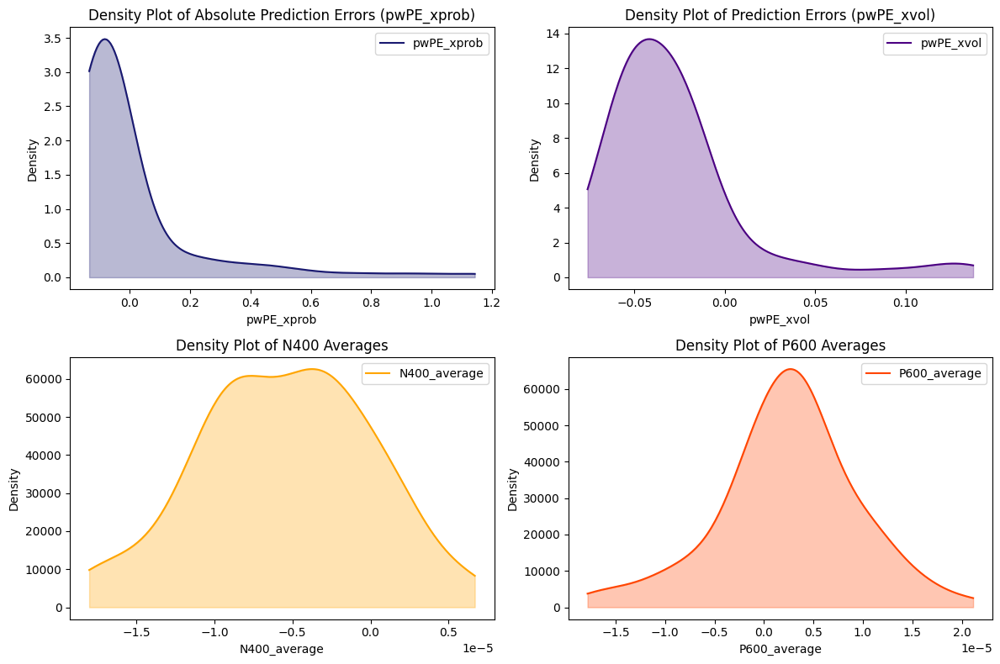

In [746]:
from scipy.stats import gaussian_kde

plt.figure(figsize=(12, 8))

def plot_density(data, label, color, ax):
    density = gaussian_kde(data)
    xs = np.linspace(min(data), max(data), 200)
    ax.plot(xs, density(xs), color=color, label=label)
    ax.fill_between(xs, density(xs), color=color, alpha=0.3)
    ax.set_xlabel(label)
    ax.set_ylabel('Density')
    ax.legend()

fig, axs = plt.subplots(2, 2, figsize=(12, 8))

plot_density(pwPE_xprob, 'pwPE_xprob', 'midnightblue', axs[0, 0])
axs[0, 0].set_title('Density Plot of Absolute Prediction Errors (pwPE_xprob)')

plot_density(pwPE_1_df['pwPE_xvol'], 'pwPE_xvol', 'indigo', axs[0, 1])
axs[0, 1].set_title('Density Plot of Prediction Errors (pwPE_xvol)')

plot_density(pwPE_1_df['N400_average'], 'N400_average', 'orange', axs[1, 0])
axs[1, 0].set_title('Density Plot of N400 Averages')

plot_density(pwPE_1_df['P600_average'], 'P600_average', 'orangered', axs[1, 1])
axs[1, 1].set_title('Density Plot of P600 Averages')

plt.tight_layout()

plt.show()